## Repr similarity

In [1]:
import os
import torch
import random
import string
import numpy as np
import pandas as pd
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
import seaborn as sns
import matplotlib.pyplot as plt
from utils import load_experiment

np.random.seed(42)
random.seed(42)

def get_new_labels_task0(label):
    if label in [0,1]:
        return 0
    elif label in [2,3,4]:
        return 1
    elif label in [5,6,7]:
        return 2
    elif label in [8,9,10]:
        return 3
    elif label in [11,12]:
        return 4

def get_encodings(model_dict, idxs, task_num=2):
    dataset, model, config = load_experiment(model_dict['config'], model_dict['ckpt'])
    X, y = dataset[idxs]
    y = y.detach().numpy()
    if task_num==0:
        labels = np.vectorize(get_new_labels_task0)(y)
        y = labels[:,0]*5 + labels[:,1]
    elif task_num==1:
        condition = y[:,0] == y[:,1]         
    elif task_num==2:
        condition = y[:,0] <= y[:,1]
    elif task_num==3:
        condition = (y[:,0] < 6) | ((y[:,0] >= 6) & (y[:,1] >= 6)) 

    try:
        y = np.where(condition, 1, 0)
    except:
        pass
    
    mu, logvar = model.encode(X)
    #Z = model.reparameterize(mu, logvar).detach().numpy()
    mu = mu.detach().numpy()
    # logvar = logvar.detach().numpy()
    #Z = np.concatenate([mu, logvar], axis=1)
    return mu, y

def compute_dissimilarity_m(idxs, enc, **kwargs):
    l = enc.shape[1]
    df = pd.DataFrame(enc, columns=[f'z{i}' for i in range(l)])
    df['idx'] = idxs
    df.set_index('idx', inplace=True)
    return .5 * (1 - df.T.corr())

def compute_dissimilarity_m1(idxs, enc, **kwargs):
    return pd.DataFrame(data=pairwise_distances(enc), columns=idxs, index=idxs)


def get_embeddings(diss_m, n_components=2):
    embedding = MDS(n_components=n_components, dissimilarity='precomputed', random_state=42)
    out_ = embedding.fit_transform(diss_m)
    return out_

def get_idx2label(row):
    return f'{row[169]},{row[170]}' 

## Classification Tasks

#### select images

In [2]:
data = pd.read_csv('data/mazes_200k_2corridors_13x13.csv', header=None)
data = data.iloc[185_000:]
data['diff'] = data.iloc[:,169] - data.iloc[:,170]
#data = data.sort_values(by=['diff'])
n_imgs = 1000
idxs = data.sample(n_imgs).index
selected_idxs = [
    185_044, #0,12
    199_915, #2,10
    194_158, #4,8
    189_971, #6,6
    190_889, #8,4
    187_869, #10,2
    193_280, #12,0
    191126, #0,0
    185419, #2,2
    198997, #10,10
    197722, #12,12
    195734, #2,4
    194955, #4,2
    198524, #8,10
    185387, #10,8
    198185, #6,12
    192299, #6,0
    191412, #12,6
    188274, #0,6
    #185250, #6,4
    #196000, #6,8
    190549, #1,5
    190769, #5,1
    186536, #7,11
    188431, #11,7
    
    
]
idxs = idxs.union(selected_idxs)
data = data.loc[idxs].sort_values(by=['diff'])
idxs = data.index
idx2label = data.apply(get_idx2label, axis=1).to_dict()

In [3]:
data[(data.iloc[:,169]==11)&(data.iloc[:,170]==7)]

,0,1,2,3,4,5,6,7,8,9,...,162,163,164,165,166,167,168,169,170,diff
194238,1,1,1,1,1,1,1,1,1,1,...,0,0,1,1,0,1,1,11,7,4
189755,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,1,1,1,11,7,4
197036,1,1,1,1,1,1,1,1,1,0,...,0,0,0,1,1,1,1,11,7,4
186373,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,1,1,1,11,7,4
188431,1,1,1,1,1,1,1,1,1,1,...,0,0,1,1,1,1,1,11,7,4
194318,1,1,1,1,1,1,1,1,1,1,...,0,0,0,1,1,1,1,11,7,4


In [4]:
reidxs = {idx: i for i, idx in enumerate(idxs)}
reidx2label = {reidxs[idx]: idx2label[idx] for idx in idxs}
selected_reidxs = [reidxs[selected_idx] for selected_idx in selected_idxs]


# idx to be annotated in the scatter plot
idx_toLabel = []#list(range(0, n_imgs, 50))
idx_toLabel.extend(selected_reidxs)

#### select models

In [5]:
models = {

    'task0':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task0/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task0/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task0/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task0/max_c_0.3/checkpoints/last.ckpt'
        },
    },

    'task1':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task1/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task1/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task1/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task1/max_c_0.3/checkpoints/last.ckpt'
        },
    },

    'task2':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task2/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task2/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task2/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task2/max_c_0.3/checkpoints/last.ckpt'
        },
    },

    'task3':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_CLF_task3/max_c_10/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task3/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_CLF_task3/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_CLF_task3/max_c_0.3/checkpoints/last.ckpt'
        },  
    },
}

#### plot

In [6]:
def plot_diss_m(diss_m, title, ax=None, **kwargs):
    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 3))
    else:
        fig = None
    #ax.set_title(title)
    sns.heatmap(diss_m, ax=ax, annot=False, cmap='summer_r', xticklabels=False, yticklabels=False, **kwargs)
    return fig, ax

def plot_embeddings(emb, y, idx_toLabel, reidx2label, title, palette='Pastel2', ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))
    else:
        fig = None
    #ax.set_title(title)
    sns.scatterplot(x=emb[:,0], y=emb[:,1], hue=y, palette=palette, ax=ax, s=70)
    #ax.set_xticks([])
    #ax.set_yticks([])
    eps = 0.01
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.annotate(txt, (emb[i,0]+eps, emb[i,1]), size=14)
        ax.scatter(x=emb[i,0], y=emb[i,1], facecolor='none', edgecolor='black', s=70)
    return fig, ax

def plot_embeddings_3d(emb, y, idx_toLabel, reidx2label, title):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title)
    ax.scatter(emb[:,0], emb[:,1], emb[:,2], c=y, s=10, cmap='Pastel2')
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.text(emb[i,0], emb[i,1], emb[i,2], txt, size=10)
        
    return fig, ax

def save_fig(in_fig, out_file, **kwargs):
    in_fig.savefig(out_file, bbox_inches='tight', pad_inches=0.1, **kwargs)
    
def get_fig_name(parent_dir, model_name, plot_type):
    """
    parent_dir : eucl_diss | corr_diss
    plot_type : dissM | emb
    """
    _, _, task, diss_metric = parent_dir.split('/')
    model_type, capacity = model_name.split('_')
    filename = f'{diss_metric[:4]}_t{task[-1]}_{model_type}_{capacity}_{plot_type}.png'
    out_dir = os.path.join(parent_dir, model_type, capacity)
    os.makedirs(out_dir, exist_ok=True)
    return os.path.join(out_dir, filename)

### IMG FOR PAPER

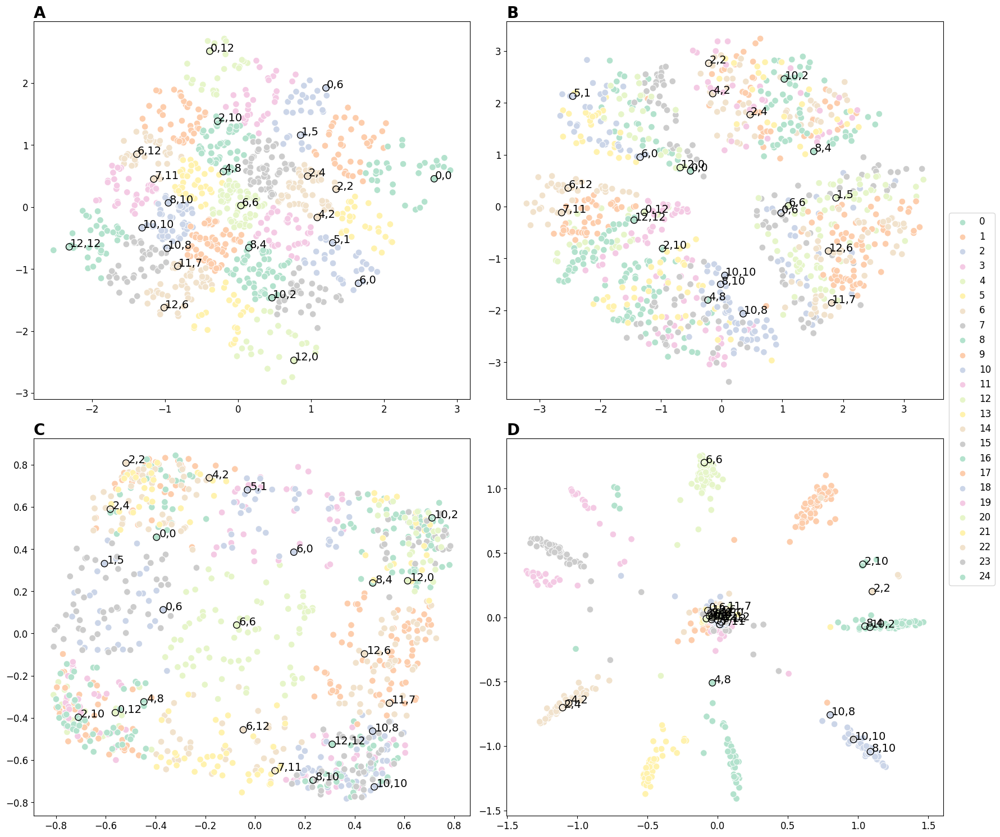

In [49]:
np.random.seed(42)
random.seed(42)
    
task = 'task0'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

fig, axs = plt.subplots(2, 2, figsize=(17, 15))
axs = axs.flatten()
i = 0

for model_name, model_dict in models[task].items():
    
    Z, y = get_encodings(model_dict, idxs, task_num=int(task[-1]))
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    #fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    #out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    #save_fig(fig, out_figname)

    if i in []:
        new_emb = emb.copy()
        new_emb[:,0] = emb[:,1]
        new_emb[:,1] = -emb[:,0]
        emb = new_emb

    _, _ = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}', ax=axs[i])


    # increase font size for labels
    for item in axs[i].get_yticklabels() + axs[i].get_xticklabels() + axs[i].get_legend().get_texts():
        item.set_fontsize(12)

    #write a bold letter on every plot
    axs[i].text(0, 1.01, string.ascii_uppercase[i], transform=axs[i].transAxes, size=20, weight='bold')

    #out_figname = get_fig_name(parent_dir, model_name, 'emb')
    #save_fig(fig, out_figname)

    handles, labels = axs[0].get_legend_handles_labels()
    if task == 'task0':
        # hide legend
        axs[i].get_legend().remove()

    i += 1
    

# set fig legend outside the plot
if task == 'task0':
    fig.legend(handles, labels, fontsize=12, bbox_to_anchor=(1.05, 0.75))


fig.tight_layout()
fig.show()


In [50]:
save_fig(fig, f"imgs/for_paper/clf_bias/eucl_emb_{task}.png", dpi=600)

### Other imgs

##### base vs task2

**euclidean dissimilarity**

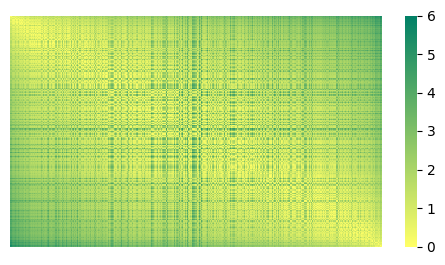

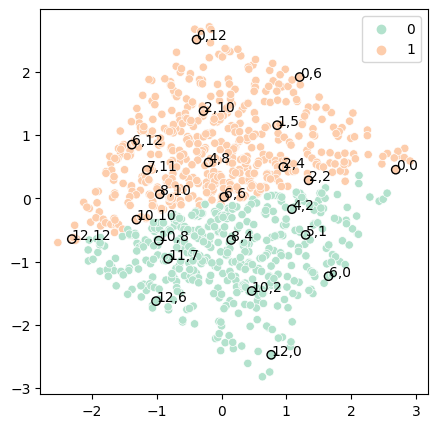

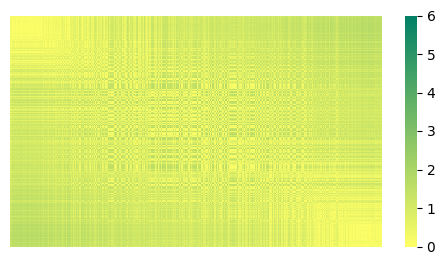

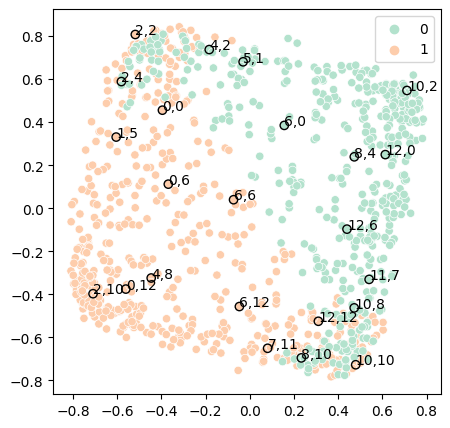

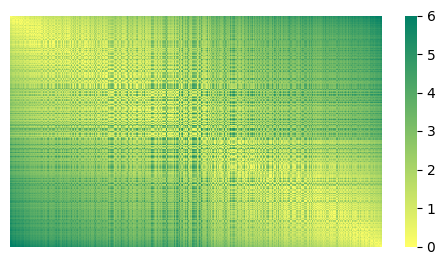

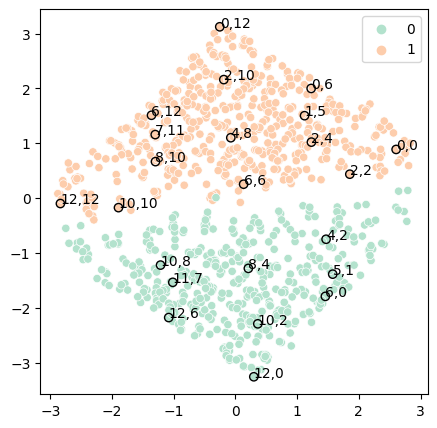

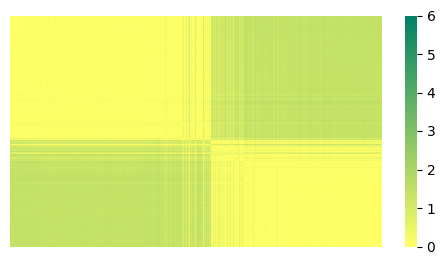

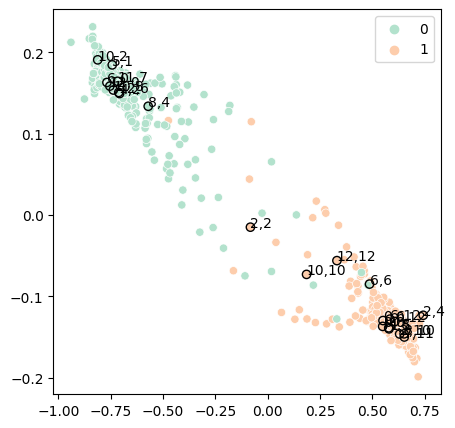

In [ ]:
np.random.seed(42)
random.seed(42)

task = 'task2'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=2)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

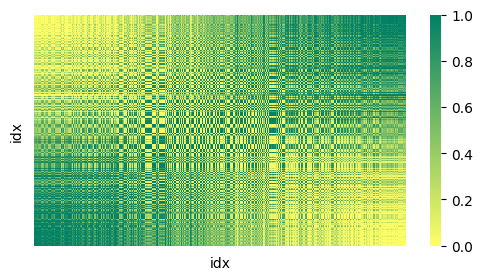

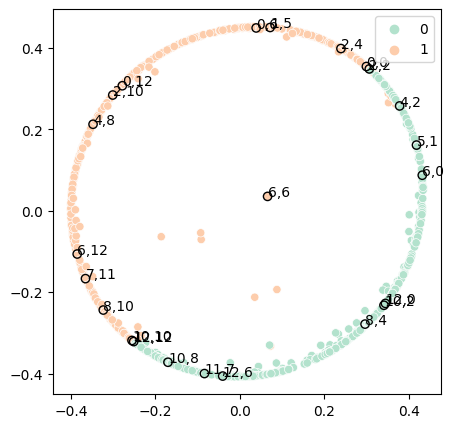

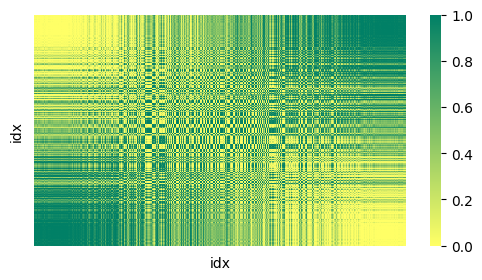

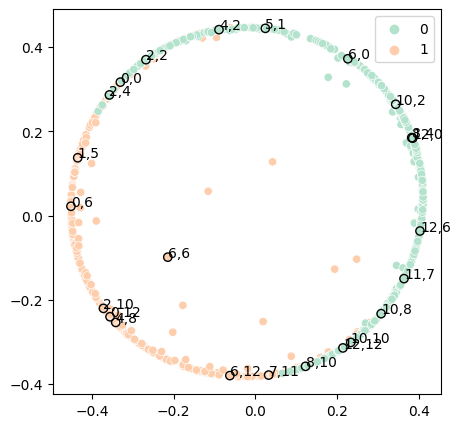

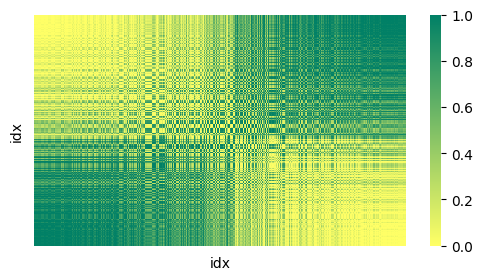

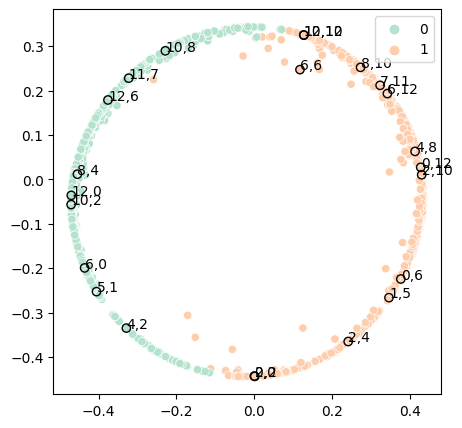

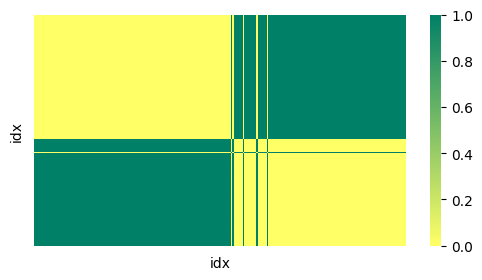

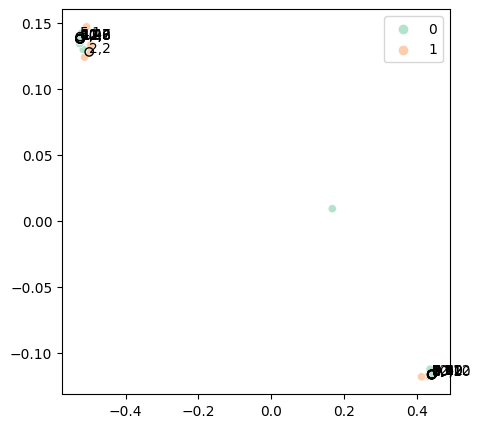

In [8]:
np.random.seed(42)
random.seed(42)

task = 'task2'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=2)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

**correlation dissimilarity 3D**

In [ ]:
for model_name, model_dict in models['experiment2'].items():
    Z, y = get_encodings(model_dict, idxs, task_num=2)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

---

In [ ]:
#buoni
idxs = [
    185_044, #00-12
    199_915, #02-10
    194_158, #04-08
    189_971, #06-06
    190_889, #08-04
    187_869, #10-02
    193_280, #12-00
]

---

In [46]:
#plot 3d points using plotly
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=emb[:,0],
    y=emb[:,1],
    z=emb[:,2],
    mode='markers',
    text=list(reidx2label.values()),
    # marker=dict(
    #     size=12,
    #     #color=s.index,                # set color to an array/list of desired values
    #     colorscale='Viridis',   # choose a colorscale
    #     opacity=0.8
    # )
)])

fig.show()

##### base vs task3

**euclidean dissimilarity**

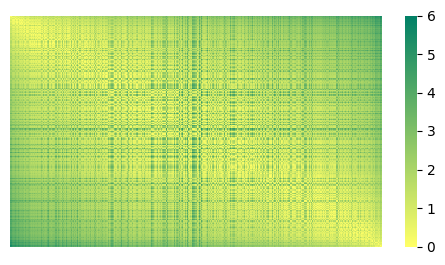

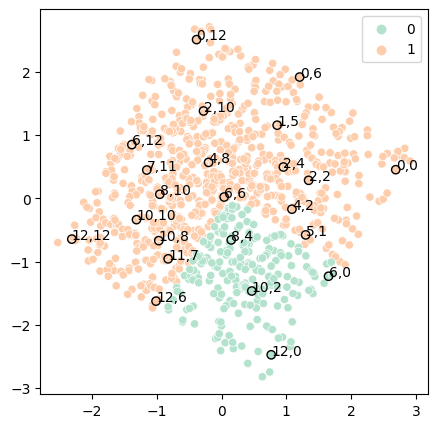

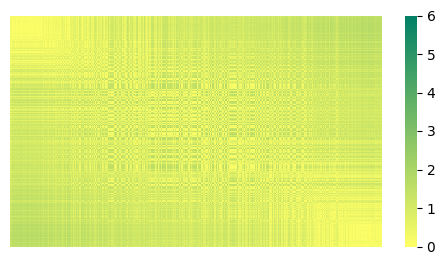

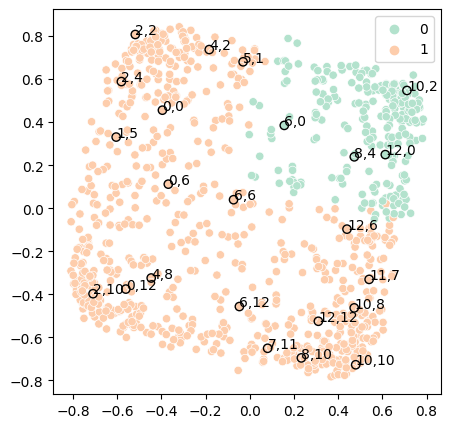

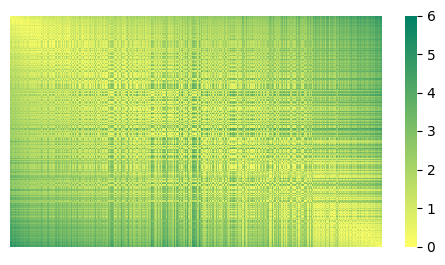

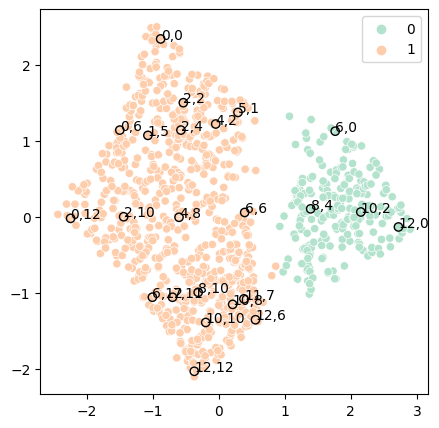

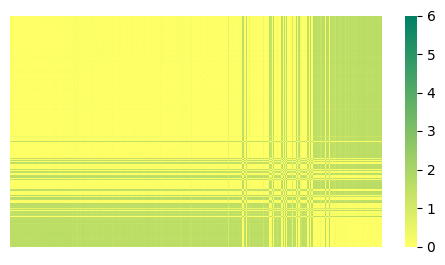

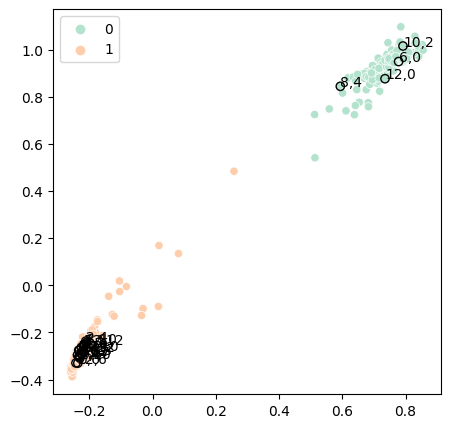

In [9]:
np.random.seed(42)
random.seed(42)

task = 'task3'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=3)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

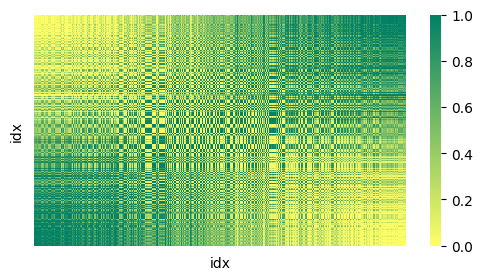

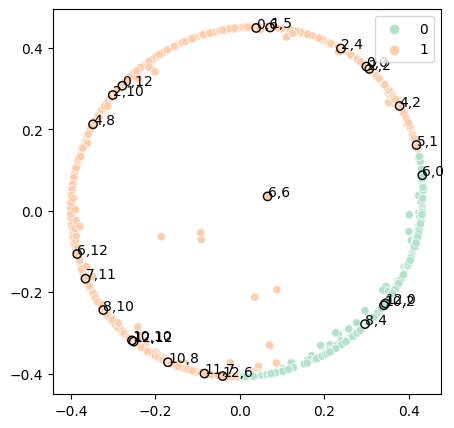

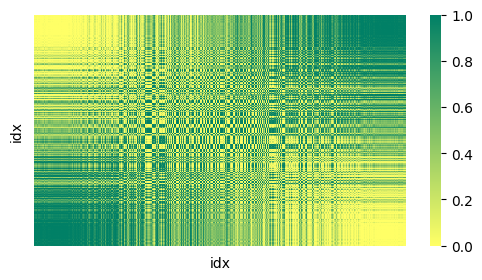

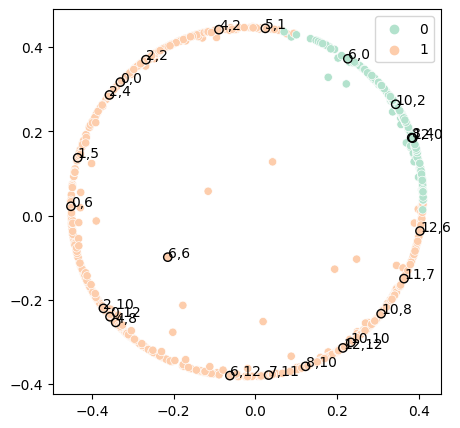

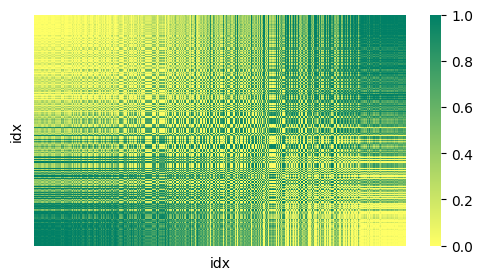

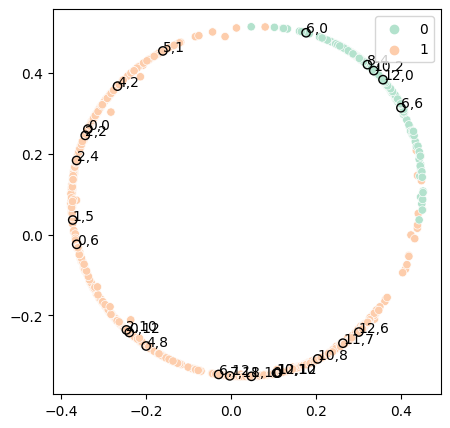

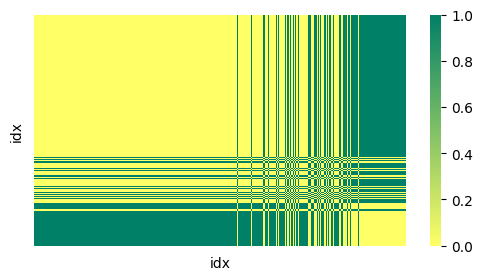

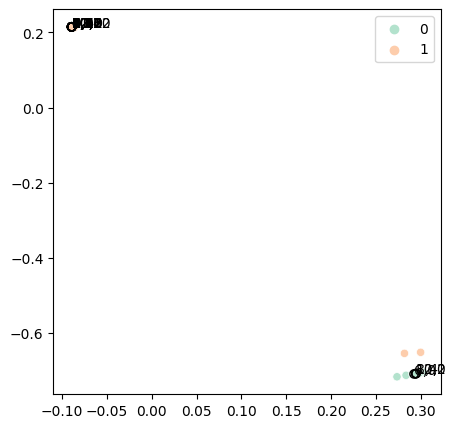

In [10]:
np.random.seed(42)
random.seed(42)

task = 'task3'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=3)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity 3D**

In [ ]:
for model_name, model_dict in models['experiment3'].items():
    Z, y = get_encodings(model_dict, idxs, task_num=3)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

##### base vs task1

**euclidean dissimilarity**

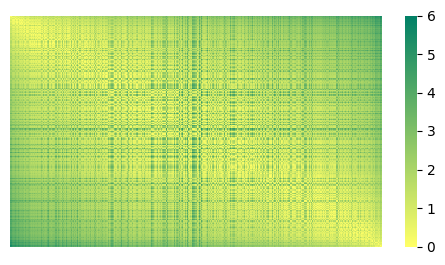

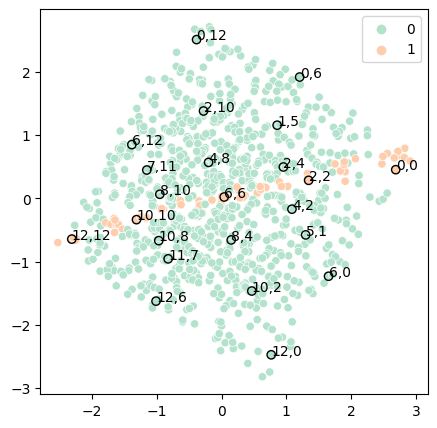

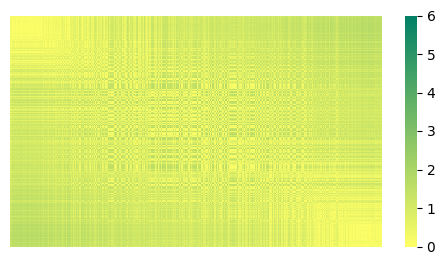

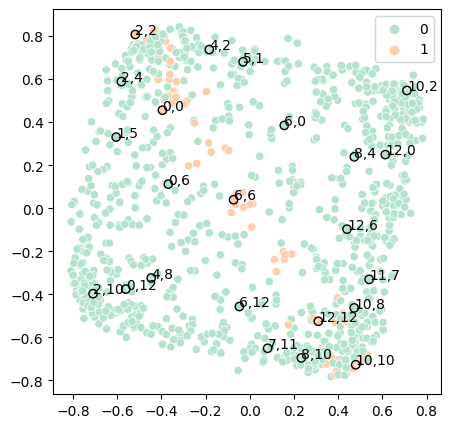

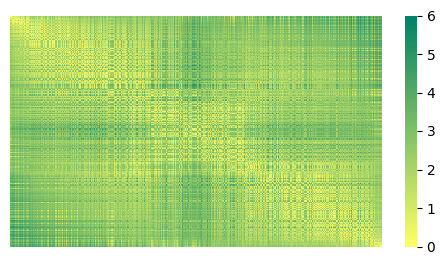

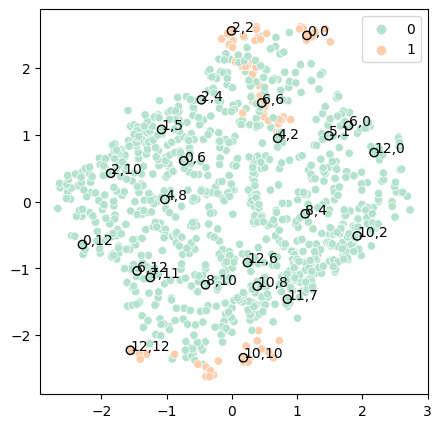

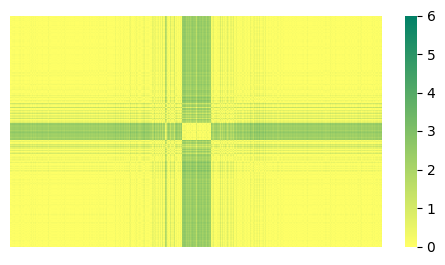

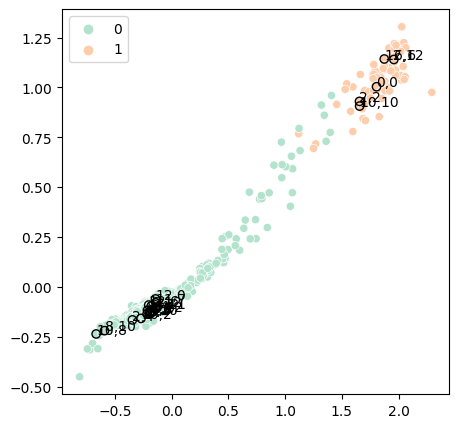

In [11]:
np.random.seed(42)
random.seed(42)

task = 'task1'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=1)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

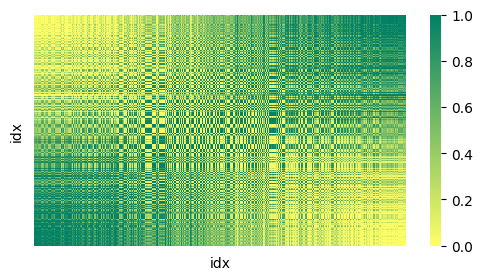

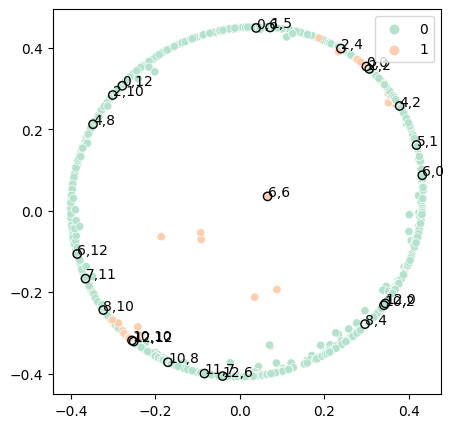

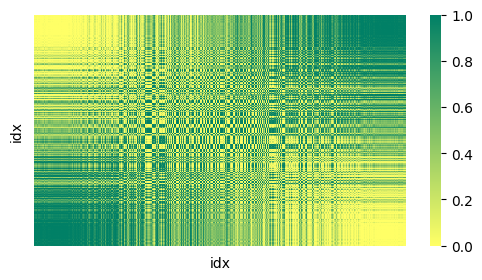

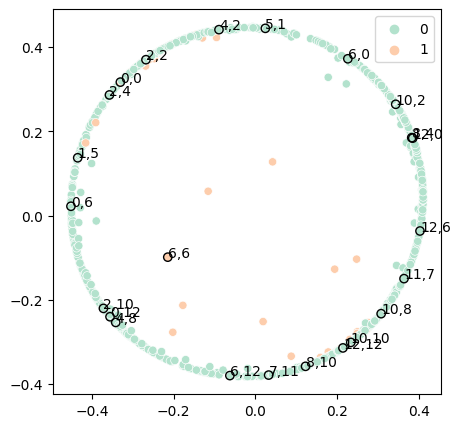

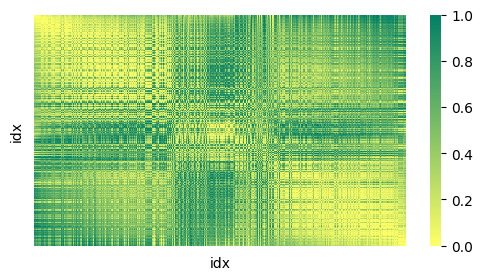

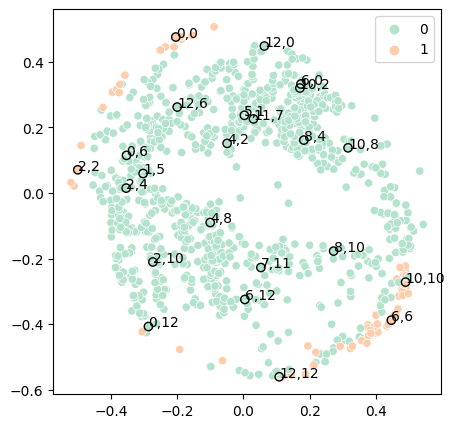

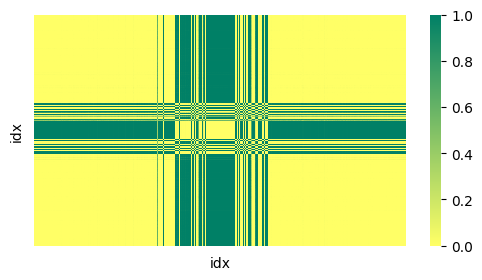

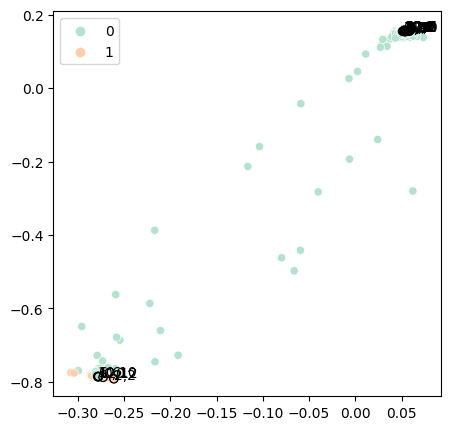

In [12]:
np.random.seed(42)
random.seed(42)

task = 'task1'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=1)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity 3D**

In [ ]:
for model_name, model_dict in models['experiment1'].items():
    Z, y = get_encodings(model_dict, idxs, task_num=1)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

##### base vs task0

**euclidean dissimilarity**

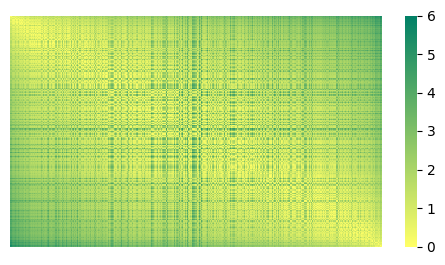

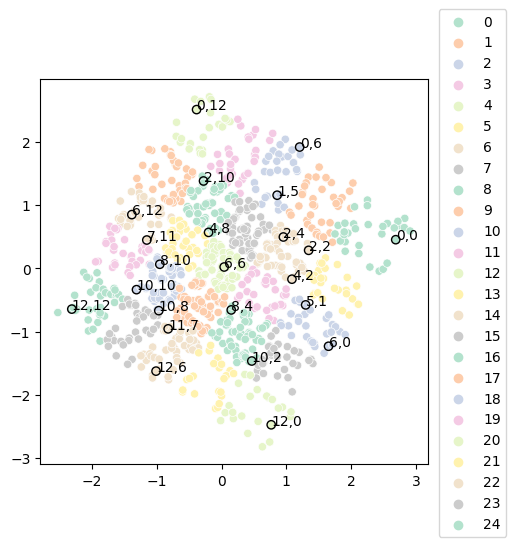

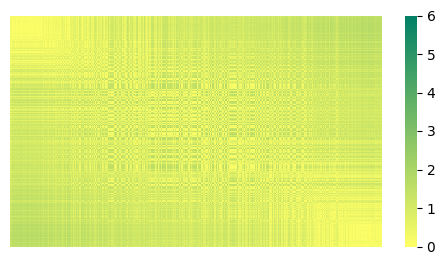

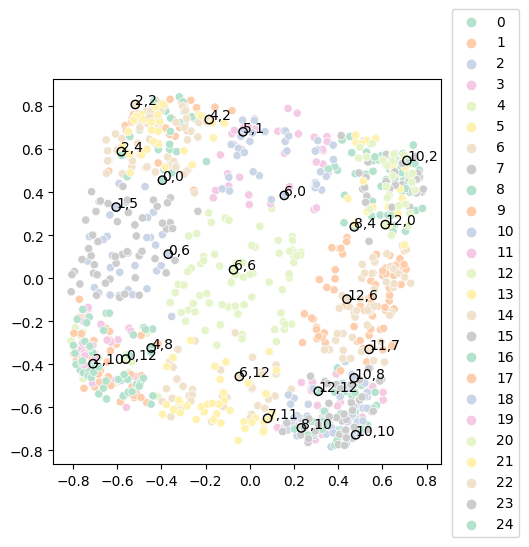

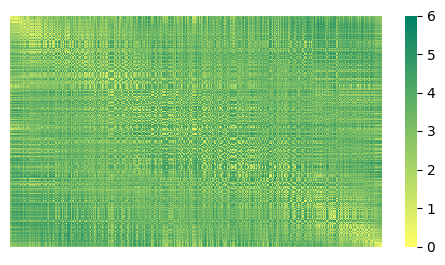

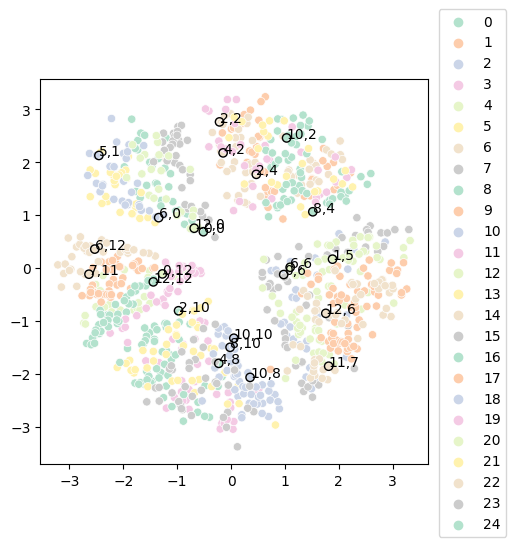

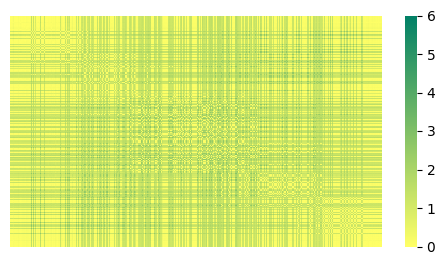

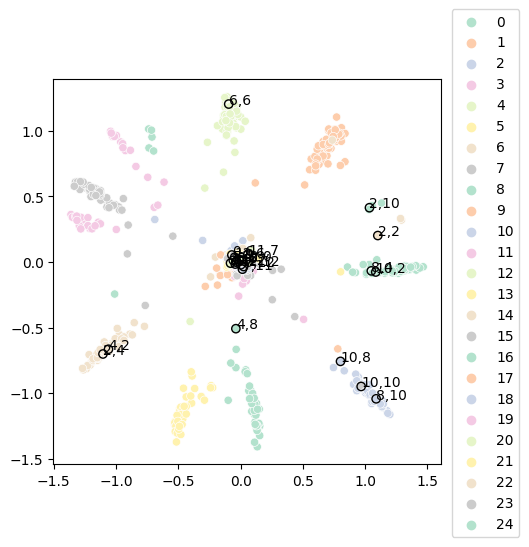

In [38]:
np.random.seed(42)
random.seed(42)

task = 'task0'
parent_dir = f'imgs/clf_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=0)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    ax.legend(bbox_to_anchor=(1.01, 1.2))

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

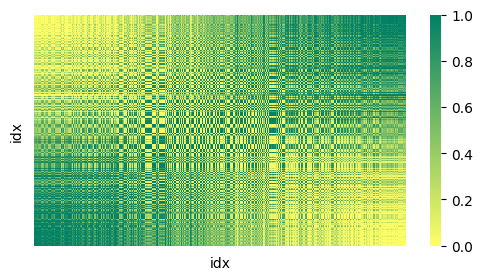

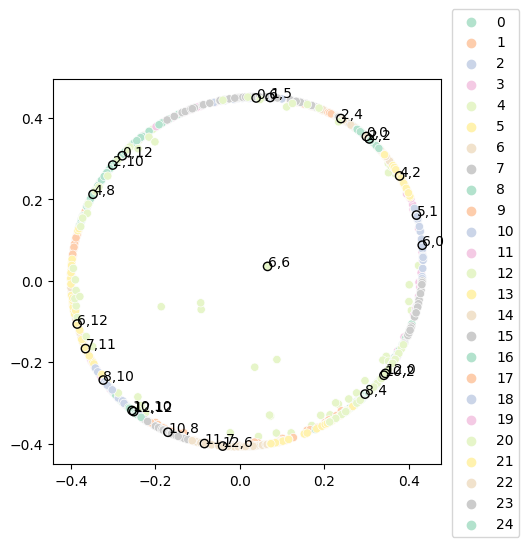

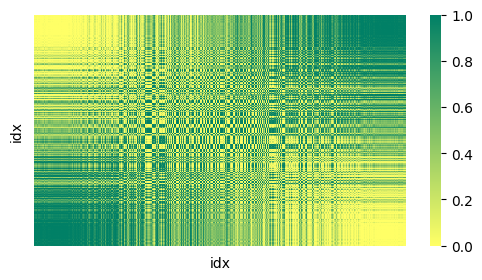

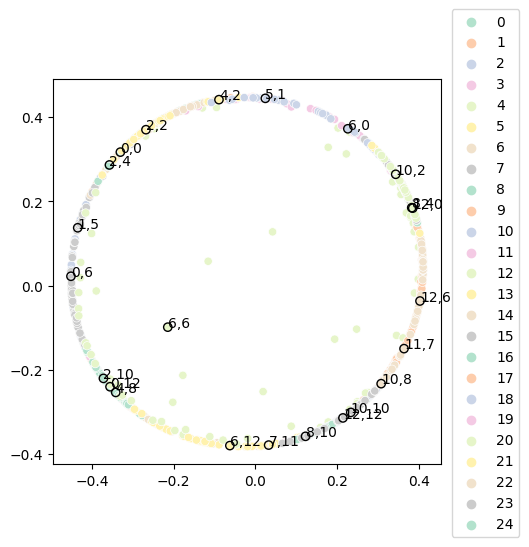

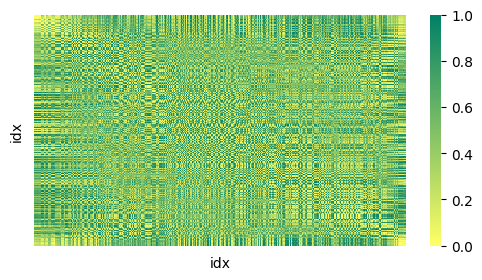

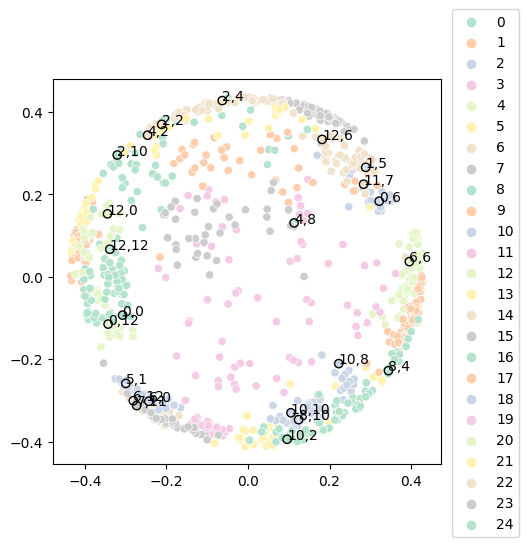

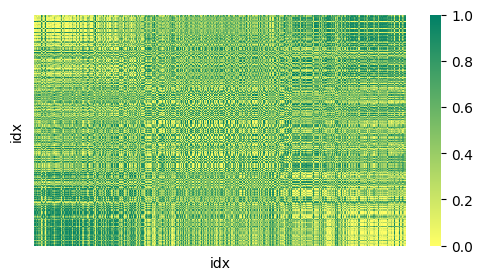

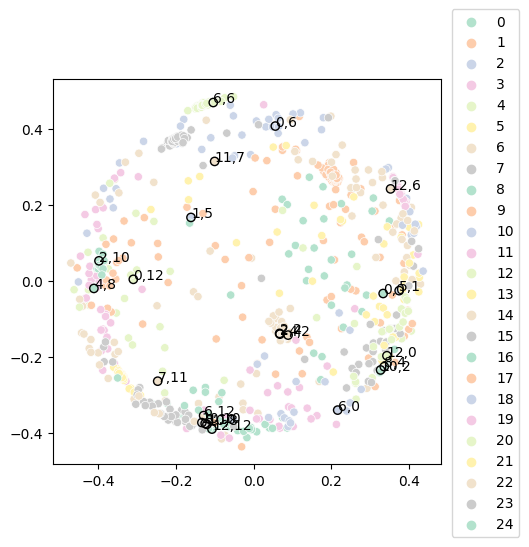

In [39]:
np.random.seed(42)
random.seed(42)

task = 'task0'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=0)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    ax.legend(bbox_to_anchor=(1.01, 1.2))

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity 3D**

In [ ]:
np.random.seed(42)
random.seed(42)

task = 'task0'
parent_dir = f'imgs/clf_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    Z, y = get_encodings(model_dict, idxs, task_num=0)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m, n_components=3)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    fig, ax = plot_embeddings_3d(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')
    fig.show()

In [65]:
#plot 3d points using plotly
import plotly.graph_objects as go

np.random.seed(42)
random.seed(42)

task = 'task0'
#parent_dir = f'imgs/clf_bias/{task}/corr_diss'

model_name = 'distorted_high'
model_dict = models[task][model_name]

Z, y = get_encodings(model_dict, idxs, task_num=0)
diss_m = compute_dissimilarity_m1(idxs, Z)
emb = get_embeddings(diss_m, n_components=3)

In [79]:
from sklearn.metrics import classification_report

dataset, model, config = load_experiment(model_dict['config'], model_dict['ckpt'])
X, _ = dataset[idxs]

mu, log_var = model.encode(X)
Z = model.reparameterize(mu, log_var)
preds = model.classify(Z)
pred_labels = torch.argmax(preds, dim=1)

print(classification_report(y_true=y, y_pred=pred_labels))

              precision    recall  f1-score   support

           0       0.76      1.00      0.86        31
           1       1.00      0.97      0.99        38
           2       1.00      1.00      1.00        30
           3       0.91      1.00      0.96        32
           4       0.00      0.00      0.00        24
           5       0.68      1.00      0.81        27
           6       1.00      1.00      1.00        54
           7       1.00      1.00      1.00        52
           8       0.88      1.00      0.94        51
           9       0.00      0.00      0.00        41
          10       1.00      1.00      1.00        33
          11       1.00      1.00      1.00        34
          12       0.99      0.99      0.99        71
          13       0.98      1.00      0.99        41
          14       0.68      1.00      0.81        39
          15       0.66      1.00      0.80        33
          16       1.00      1.00      1.00        59
          17       0.99    

/home/leo/.python-envs/torch-gpu-env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/home/leo/.python-envs/torch-gpu-env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/home/leo/.python-envs/torch-gpu-env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [63]:
import plotly.graph_objects as go
import plotly.express as px

fig = go.Figure(data=[go.Scatter3d(
    x=emb[:,0],
    y=emb[:,1],
    z=emb[:,2],
    mode='markers',
    text=list(reidx2label.values()),
    marker=dict(
        size=4,
        color=y,                # set color to an array/list of desired values
        colorscale=px.colors.qualitative.Alphabet,

    #     opacity=0.8
    )
)])
# increase fig sizze
fig.update_layout(
    width=600,
    height=600,
)
fig.show()

---

## Statistical bias

In [8]:
import os
import torch
import random
import string
import numpy as np
import pandas as pd
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
import seaborn as sns
import matplotlib.pyplot as plt
from utils import load_experiment


def get_encodings(model_dict, idxs, task_num=2, data_path=None):
    dataset, model, config = load_experiment(model_dict['config'], model_dict['ckpt'], data_path=data_path)
    X, y = dataset[idxs]
    y = y.detach().numpy()
    if task_num=='BottomBias':
        condition = y[:,1] > 6
    elif task_num=='AlignBias':
        condition = y[:,0] == y[:,1]

    y = np.where(condition, 1, 0)
    
    mu, logvar = model.encode(X)
    #Z = model.reparameterize(mu, logvar).detach().numpy()
    mu = mu.detach().numpy()
    # logvar = logvar.detach().numpy()
    #Z = np.concatenate([mu, logvar], axis=1)
    return mu, y

def compute_dissimilarity_m(idxs, enc, **kwargs):
    l = enc.shape[1]
    df = pd.DataFrame(enc, columns=[f'z{i}' for i in range(l)])
    df['idx'] = idxs
    df.set_index('idx', inplace=True)
    return .5 * (1 - df.T.corr())

def compute_dissimilarity_m1(idxs, enc, **kwargs):
    return pd.DataFrame(data=pairwise_distances(enc), columns=idxs, index=idxs)


def get_embeddings(diss_m, n_components=2, **kwargs):
    embedding = MDS(n_components=n_components, dissimilarity='precomputed', random_state=42, **kwargs)
    out_ = embedding.fit_transform(diss_m)
    return out_

def get_idx2label(row):
    return f'{row[169]},{row[170]}' 

#### select images

In [2]:
data = pd.read_csv('data/mazes_200k_2corridors_13x13.csv', header=None)
data = data.iloc[180_000:]
data['diff'] = data.iloc[:,169] - data.iloc[:,170]
#data = data.sort_values(by=['diff'])
n_imgs = 1000
idxs = data.sample(n_imgs).index
selected_idxs = [
    185_044, #0,12
    199_915, #2,10
    194_158, #4,8
    189_971, #6,6
    190_889, #8,4
    187_869, #10,2
    193_280, #12,0
    191126, #0,0
    185419, #2,2
    198997, #10,10
    197722, #12,12
    195734, #2,4
    194955, #4,2
    198524, #8,10
    185387, #10,8
    198185, #6,12
    192299, #6,0
    191412, #12,6
    188274, #0,6
    #185250, #6,4
    #196000, #6,8
    190549, #1,5
    190769, #5,1
    186536, #7,11
    188431, #11,7
]
idxs = idxs.union(selected_idxs)
data = data.loc[idxs].sort_values(by=['diff'])
idxs = data.index
idx2label = data.apply(get_idx2label, axis=1).to_dict()

In [13]:
data = pd.read_csv('data/mazes_85k_2corridors_AlignedBias3000vs300.csv', header=None)
data = data#.iloc[80_000:]
data['diff'] = data.iloc[:,169] - data.iloc[:,170]
#data = data.sort_values(by=['diff'])
n_imgs = 1000
idxs = data.sample(n_imgs).index
selected_idxs = [
    84938, #0,0
    84381, #2,2
    82928, #4,4
    84049, #6,6
    80962, #8,8
    80421, #10,10
    81643, #12,12
    78543, #0,12
    81565, #0,6
    65369, #6,0
    50997, #12,0
    62702, #4,8
    75935, #8,4
    53333, #1,5
    64082, #11,7
]
idxs = idxs.union(selected_idxs)
data = data.loc[idxs].sort_values(by=['diff'])
idxs = data.index
idx2label = data.apply(get_idx2label, axis=1).to_dict()

In [14]:
reidxs = {idx: i for i, idx in enumerate(idxs)}
reidx2label = {reidxs[idx]: idx2label[idx] for idx in idxs}
selected_reidxs = [reidxs[selected_idx] for selected_idx in selected_idxs]


# idx to be annotated in the scatter plot
idx_toLabel = []#list(range(0, n_imgs, 50))
idx_toLabel.extend(selected_reidxs)

In [31]:
#data[(data.iloc[:,169] == 11)&(data.iloc[:,170] == 7)]

#### select models

In [6]:
models = {

    'BottomBias':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml', 
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_10/hparams.yaml',
            'data_path': 'data/mazes_200k_2corridors_13x13.csv',
            'ckpt': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_0.3/hparams.yaml',
            'data_path': 'data/mazes_200k_2corridors_13x13.csv',
            'ckpt': 'logs/BetaVAE_BottomBiasL2000R260_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
    },
    
    'AlignBias':{
        'base_high': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/hparams.yaml', 
            #'data_path': 'data/mazes_85k_2corridors_AlignedBias3000vs300.csv',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'distorted_high': {
            'config': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_10/hparams.yaml',
            'data_path': 'data/mazes_200k_2corridors_13x13.csv',
            'ckpt': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_10/checkpoints/last.ckpt'
        },
        'base_low': {
            'config': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/hparams.yaml',
            #'data_path': 'data/mazes_85k_2corridors_AlignedBias3000vs300.csv',
            'ckpt': 'logs/BetaVAE_Unbiased_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
        'distorted_low': {
            'config': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_0.3/hparams.yaml',
            'data_path': 'data/mazes_200k_2corridors_13x13.csv',
            'ckpt': 'logs/BetaVAE_AlignBias3000vs300_2Corridors/max_c_0.3/checkpoints/last.ckpt'
        },
    },
}

#### plot

In [5]:
def plot_diss_m(diss_m, title, ax=None, **kwargs):
    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 3))
    else:
        fig = None
    #ax.set_title(title)
    sns.heatmap(diss_m, ax=ax, annot=False, cmap='summer_r', xticklabels=False, yticklabels=False, **kwargs)
    return fig, ax

def plot_embeddings(emb, y, idx_toLabel, reidx2label, title, palette='Pastel2', ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 5))
    else:
        fig = None
    #ax.set_title(title)
    sns.scatterplot(x=emb[:,0], y=emb[:,1], hue=y, palette=palette, ax=ax, s=70)
    #ax.set_xticks([])
    #ax.set_yticks([])
    eps = 0.01
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.annotate(txt, (emb[i,0]+eps, emb[i,1]), size=14)
        ax.scatter(x=emb[i,0], y=emb[i,1], facecolor='none', edgecolor='black', s=70)
    return fig, ax

def plot_embeddings_3d(emb, y, idx_toLabel, reidx2label, title):
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title(title)
    ax.scatter(emb[:,0], emb[:,1], emb[:,2], c=y, s=10, cmap='Pastel2')
    for i in idx_toLabel:
        txt = reidx2label[i]
        ax.text(emb[i,0], emb[i,1], emb[i,2], txt, size=10)
        
    return fig, ax

def save_fig(in_fig, out_file, **kwargs):
    in_fig.savefig(out_file, bbox_inches='tight', pad_inches=0.1, **kwargs)
    
def get_fig_name(parent_dir, model_name, plot_type):
    """
    parent_dir : eucl_diss | corr_diss
    plot_type : dissM | emb
    """
    _, _, task, diss_metric = parent_dir.split('/')
    model_type, capacity = model_name.split('_')
    filename = f'{diss_metric[:4]}_t{task[-1]}_{model_type}_{capacity}_{plot_type}.png'
    out_dir = os.path.join(parent_dir, model_type, capacity)
    os.makedirs(out_dir, exist_ok=True)
    return os.path.join(out_dir, filename)

### IMG FOR PAPER

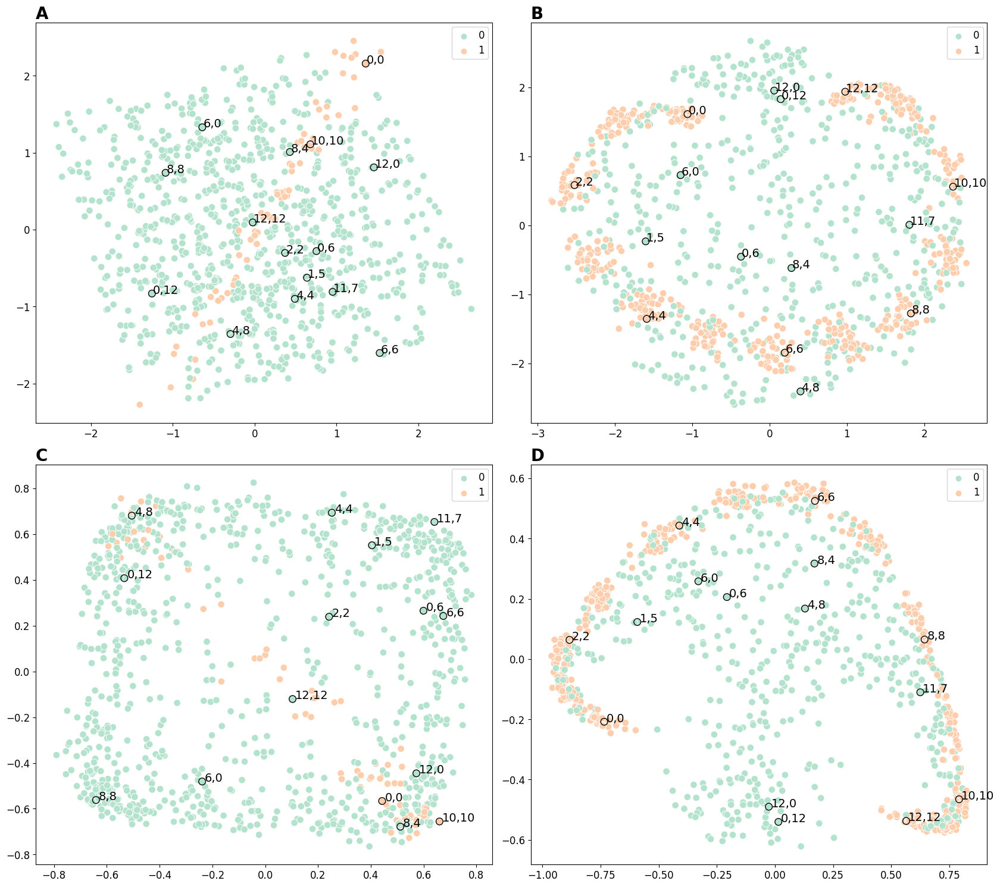

In [15]:
np.random.seed(42)
random.seed(42)
    
task = 'AlignBias'

fig, axs = plt.subplots(2, 2, figsize=(17, 15))
axs = axs.flatten()
i = 0

for model_name, model_dict in models[task].items():
    
    Z, y = get_encodings(model_dict, idxs, task_num=task)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    #fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)

    if i in []:
        new_emb = emb.copy()
        new_emb[:,0] = emb[:,1]
        new_emb[:,1] = -emb[:,0]
        emb = new_emb

    _, _ = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}', ax=axs[i])


    # increase font size for labels
    for item in axs[i].get_yticklabels() + axs[i].get_xticklabels() + axs[i].get_legend().get_texts():
        item.set_fontsize(12)

    #write a bold letter on every plot
    axs[i].text(0, 1.01, string.ascii_uppercase[i], transform=axs[i].transAxes, size=20, weight='bold')


    handles, labels = axs[0].get_legend_handles_labels()

    i += 1


fig.tight_layout()
fig.show()


In [16]:
save_fig(fig, f"imgs/for_paper/stat_bias/eucl_emb_{task}.png", dpi=600)

### Other imgs

##### Bias on bottom corridor

**euclidean dissimilarity**

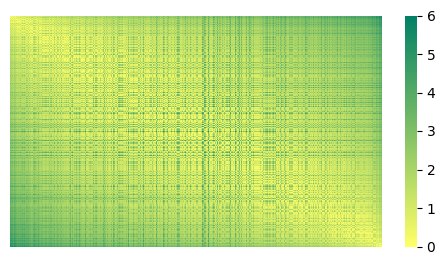

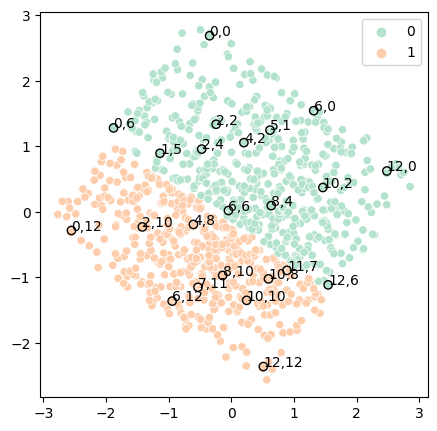

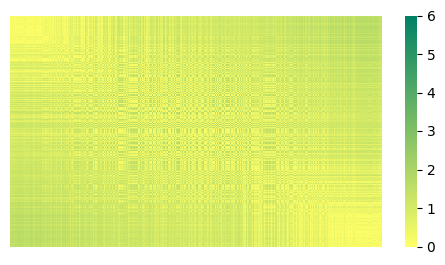

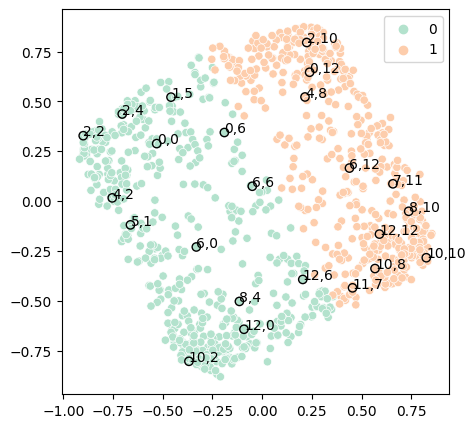

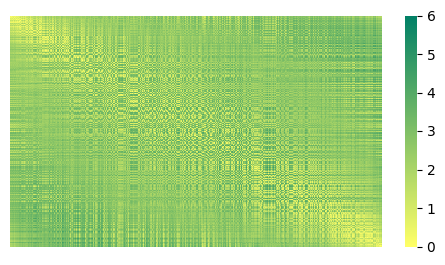

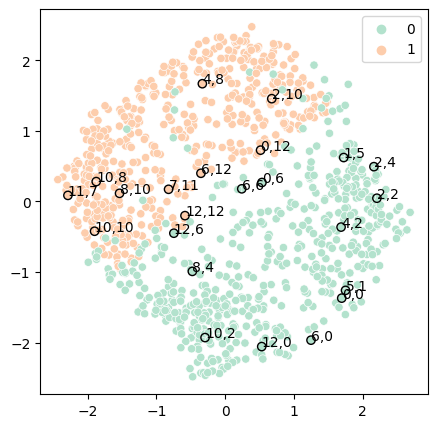

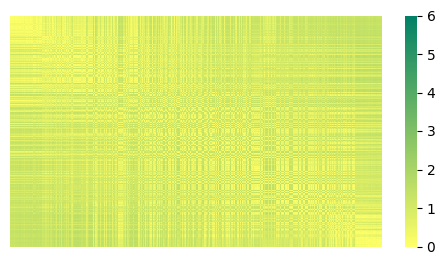

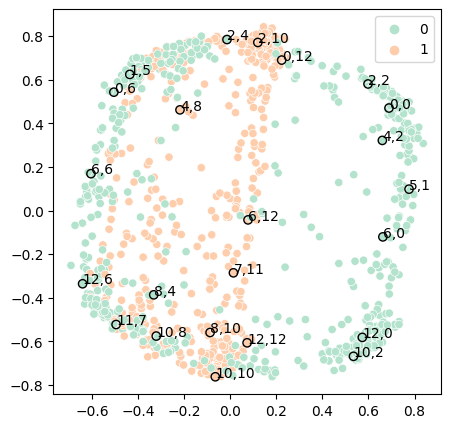

In [8]:
np.random.seed(42)
random.seed(42)

task = 'BottomBias'
parent_dir = f'imgs/stat_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
    
    Z, y = get_encodings(model_dict, idxs, task_num=task, data_path=data_path)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

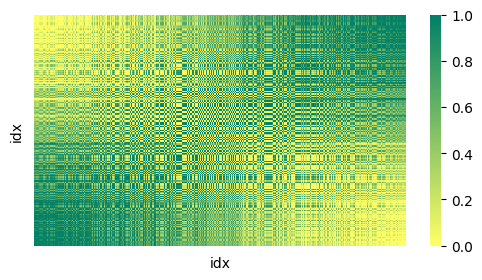

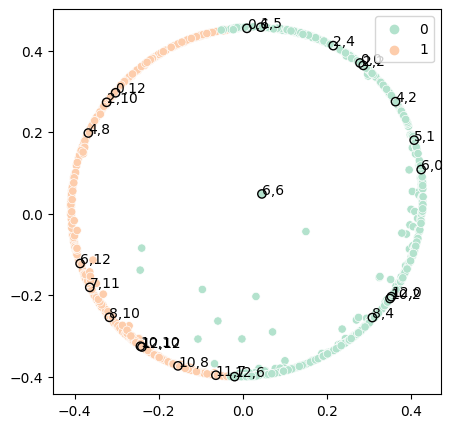

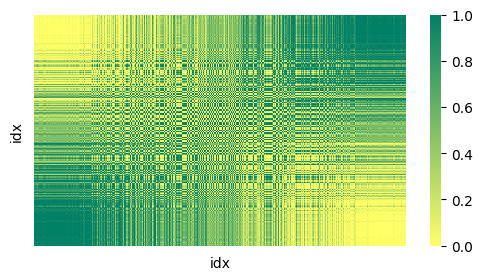

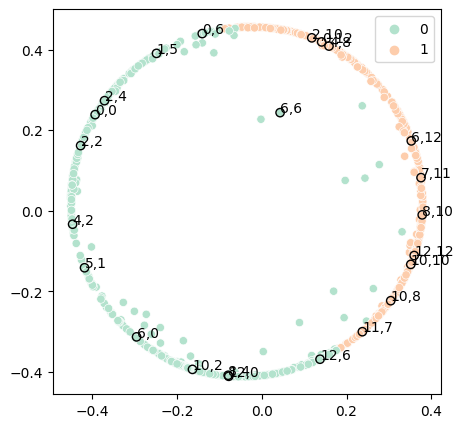

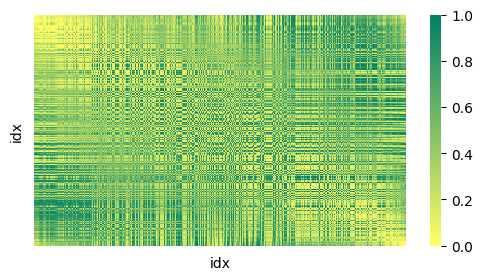

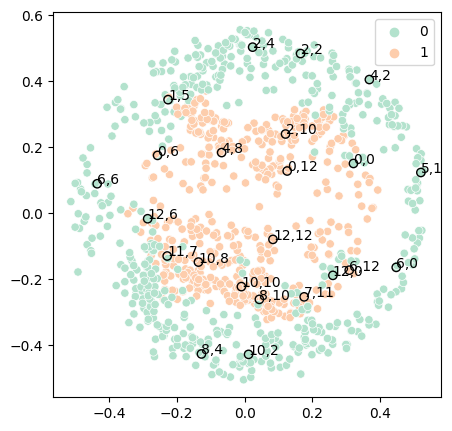

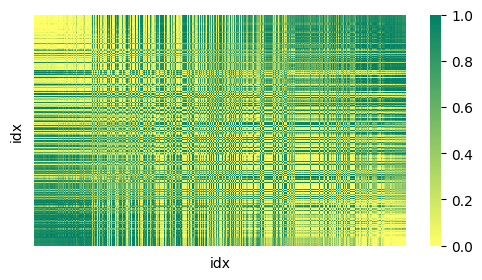

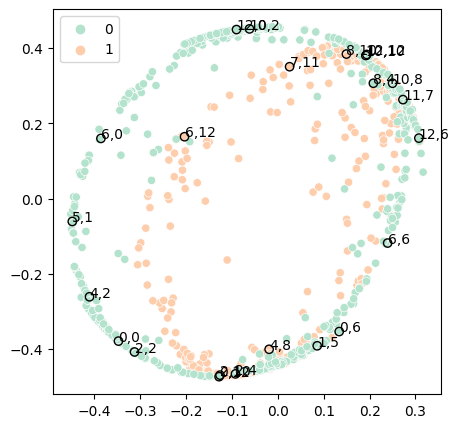

In [9]:
np.random.seed(42)
random.seed(42)

task = 'BottomBias'
parent_dir = f'imgs/stat_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
    
    Z, y = get_encodings(model_dict, idxs, task_num=task, data_path=data_path)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

##### Bias on alignment

- Cercare nuovamente indici significativi nel nuovo dataset
- Controllare se in AlignBias i modelli sono valutati sui dataset giusti 

**euclidean dissimilarity**

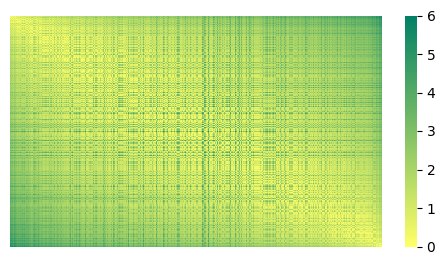

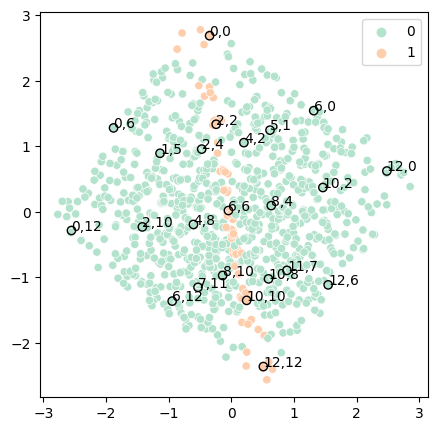

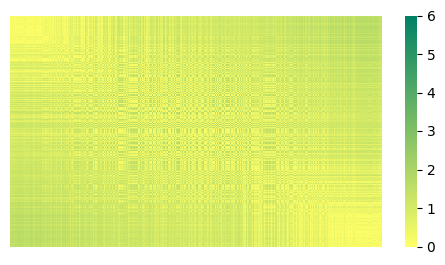

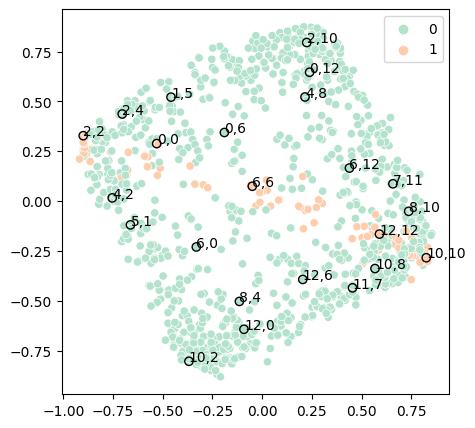

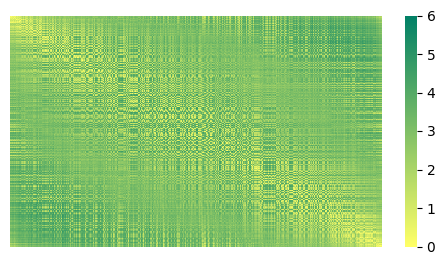

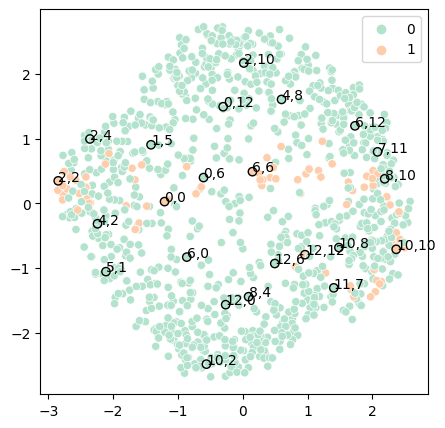

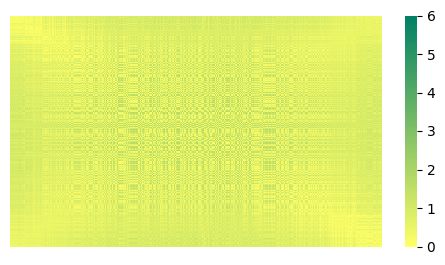

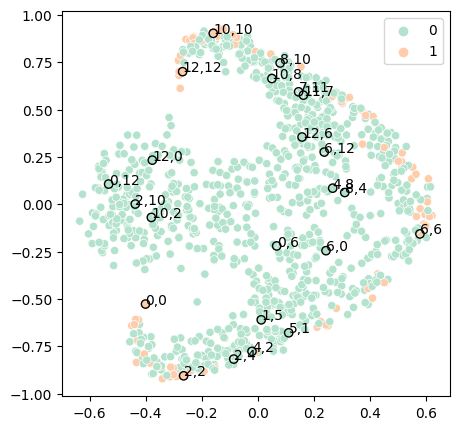

In [6]:
np.random.seed(42)
random.seed(42)

task = 'AlignBias'
parent_dir = f'imgs/stat_bias/{task}/eucl_diss'

for model_name, model_dict in models[task].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
    
    Z, y = get_encodings(model_dict, idxs, task_num=task, data_path=data_path)
    diss_m = compute_dissimilarity_m1(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=6)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()

**correlation dissimilarity**

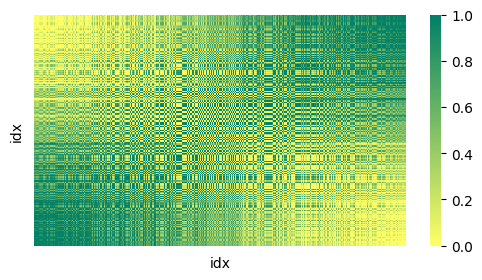

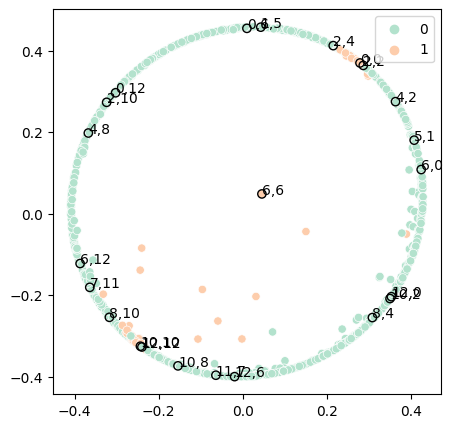

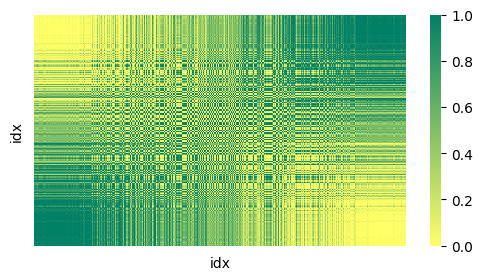

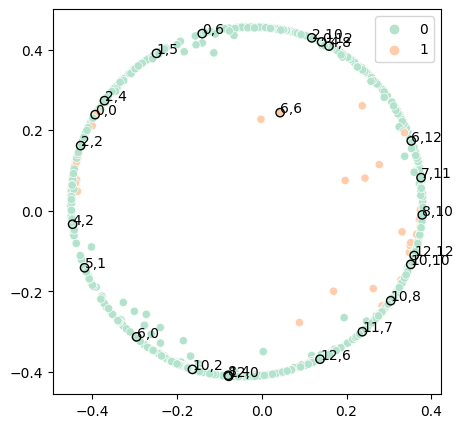

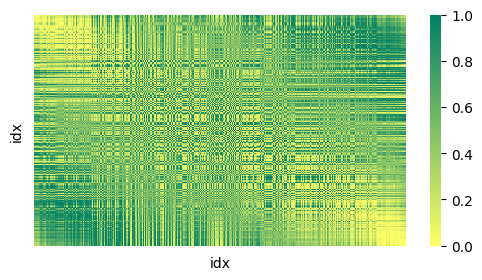

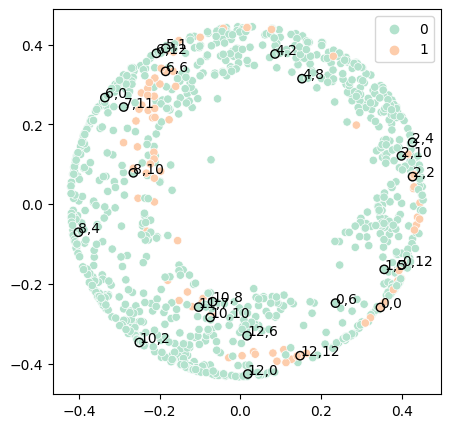

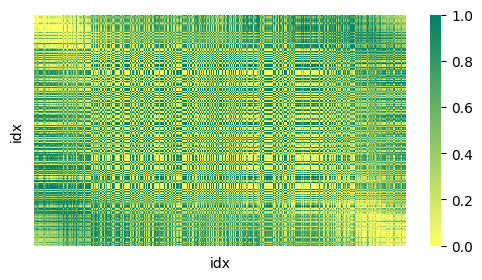

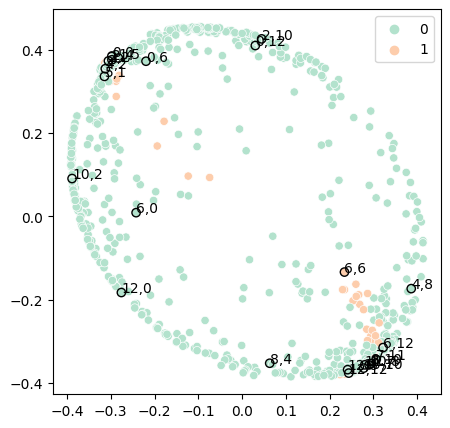

In [7]:
np.random.seed(42)
random.seed(42)

task = 'AlignBias'
parent_dir = f'imgs/stat_bias/{task}/corr_diss'

for model_name, model_dict in models[task].items():
    try:
        data_path = model_dict['data_path']
    except KeyError:
        data_path = None
    
    Z, y = get_encodings(model_dict, idxs, task_num=task, data_path=data_path)
    diss_m = compute_dissimilarity_m(idxs, Z)
    emb = get_embeddings(diss_m)

    fig, ax = plot_diss_m(diss_m= diss_m, title=f'{model_name}', vmin=0, vmax=1)
    
    out_figname = get_fig_name(parent_dir, model_name, 'dissM')
    save_fig(fig, out_figname)

    fig, ax = plot_embeddings(emb=emb, y=y, idx_toLabel=idx_toLabel, reidx2label=reidx2label, title=f'{model_name}')

    out_figname = get_fig_name(parent_dir, model_name, 'emb')
    save_fig(fig, out_figname)

    fig.show()